In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

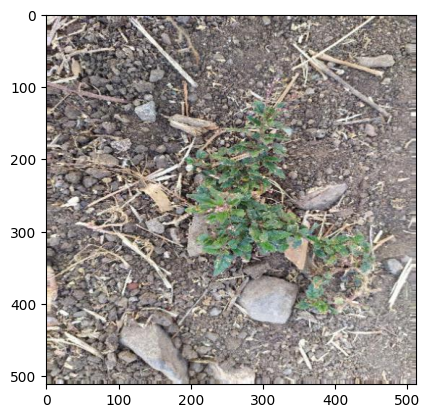

In [13]:
img = plt.imread('DATA/data/agri_0_1009.jpeg')
plt.imshow(img)

img2 = plt.imread('/content/data/agri_0_6891.jpeg')
plt.imshow(img2)

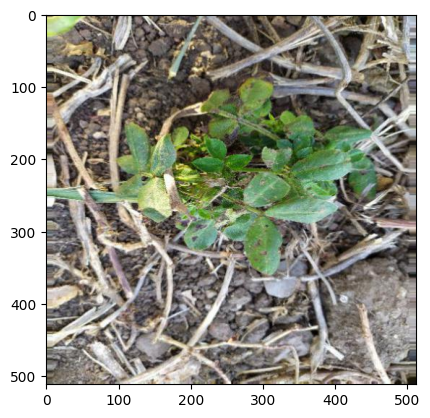

In [14]:
img2 = plt.imread('DATA/data/agri_0_6891.jpeg')
plt.imshow(img2)

In [2]:

import os
import shutil
import math
import numpy as np
from ultralytics import YOLO

# Separate the Image and text file
### In the Dataset images and labels in a same folder we must have separate it.

In [16]:
def separate_files(srclocation,deslocation,type_ofImage):
  if not os.path.exists("./"+deslocation):
    os.mkdir(deslocation)
  files = [t for t in os.listdir(srclocation) if type_ofImage in t.lower()]
  append_path=[]
  srclocation=srclocation+'/'
  for txt in files:
    temp = srclocation +(txt)
    append_path.append(temp)
  for image in append_path:
    newpath= deslocation+"/"
    shutil.move(image, newpath)

In [ ]:
separate_files('/content/data','images/','.jpeg')

In [7]:
separate_files('DATA/data','labels','.txt')

In [18]:

shutil.move('labels','DATA/data')
shutil.move('images','DATA/data')

'DATA/data/images'

# Split folders
#### we have split the for train,test and val in a particular ratio.I can here used a split-folders packages for separate for in particular ratio.

#### You can use split-folders as Python module or as a Command Line Interface (CLI).

#### If your datasets is balanced (each class has the same number of samples), choose ratio otherwise fixed.

In [19]:
import splitfolders
splitfolders.ratio('DATA/data','output',seed=1337,ratio=(.7,.15,.15),group_prefix=None,move=False)
     

Copying files: 2600 files [00:06, 402.11 files/s] 


In [21]:
testImageCount = [f for f in os.listdir('output/test/images')]

In [22]:

len(testImageCount)

196

In [23]:
model = YOLO("yolov8n.pt") #Load a pretrained model

100%|████████████████████████████████████████████████████| 6.25M/6.25M [00:03<00:00, 1.83MB/s]


# Custom dataset detection

#### In a custom data detection we have to create a YAML file.If need more details about the Yaml file the details avaliable in readme.md file

In [35]:
model.train(data='/home/samir/Documents/weeds/weeds-detection/custom.yaml', epochs=3, project='/home/samir/weeds/weeds-detection/weeds-training-results')  # train the model

Ultralytics 8.3.35 🚀 Python-3.8.10 torch-2.4.1+cu121 CPU (Intel Core(TM) i5-8350U 1.70GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/samir/Documents/weeds/weeds-detection/custom.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=0, project=/home/samir/weeds/weeds-detection/weeds-training-results, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save

train: Scanning /home/samir/Documents/weeds/weeds-detection/output/train/labels.cache... 909 i
val: Scanning /home/samir/Documents/weeds/weeds-detection/output/val/labels.cache... 195 image

Plotting labels to /home/samir/weeds/weeds-detection/weeds-training-results/train6/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to /home/samir/weeds/weeds-detection/weeds-training-results/train6
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3         0G      1.212      1.439      1.498         34        640: 100%|██████████
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%

                   all        195        316      0.761      0.616       0.71      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3         0G      1.181      1.426      1.496         45        640: 100%|██████████
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%

                   all        195        316      0.587      0.662      0.642      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3         0G       1.23      1.381      1.533         34        640: 100%|██████████
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%

                   all        195        316      0.794      0.682      0.742      0.412



3 epochs completed in 0.296 hours.
Optimizer stripped from /home/samir/weeds/weeds-detection/weeds-training-results/train6/weights/last.pt, 6.2MB
Optimizer stripped from /home/samir/weeds/weeds-detection/weeds-training-results/train6/weights/best.pt, 6.2MB

Validating /home/samir/weeds/weeds-detection/weeds-training-results/train6/weights/best.pt...
Ultralytics 8.3.35 🚀 Python-3.8.10 torch-2.4.1+cu121 CPU (Intel Core(TM) i5-8350U 1.70GHz)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%


                   all        195        316      0.792      0.678      0.742      0.412
                  crop         96        191      0.818      0.628      0.767      0.448
                  weed        100        125      0.766      0.728      0.716      0.376
Speed: 1.8ms preprocess, 105.7ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to /home/samir/weeds/weeds-detection/weeds-training-results/train6


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x789052f597f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [40]:
output_images = [t for t in os.listdir('/home/samir/weeds/weeds-detection/weeds-training-results/train6') if '.jpg' in t.lower()]
     

In [41]:
output_images

['train_batch1.jpg',
 'labels_correlogram.jpg',
 'train_batch2.jpg',
 'val_batch2_labels.jpg',
 'val_batch0_pred.jpg',
 'val_batch1_pred.jpg',
 'train_batch0.jpg',
 'val_batch0_labels.jpg',
 'labels.jpg',
 'val_batch2_pred.jpg',
 'val_batch1_labels.jpg']

In [42]:

main_path = '/home/samir/weeds/weeds-detection/weeds-training-results/train6'
for image in output_images:
  path=main_path +image
  tmp = plt.imread(path)
  plt.imshow(tmp)
  plt.title(image)
  plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/home/samir/weeds/weeds-detection/weeds-training-results/train6train_batch1.jpg'

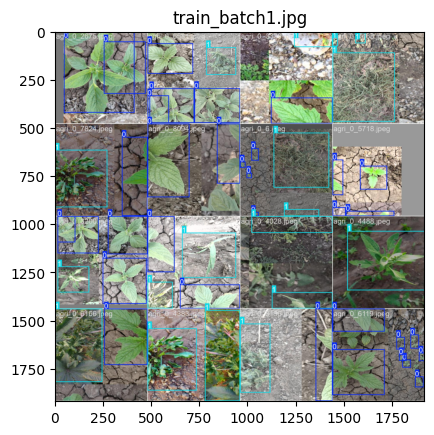

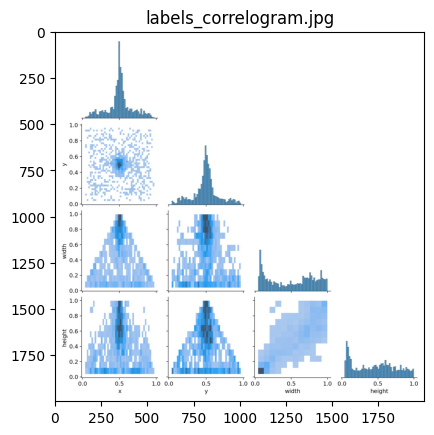

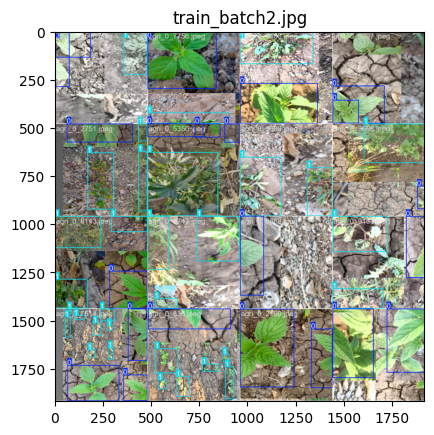

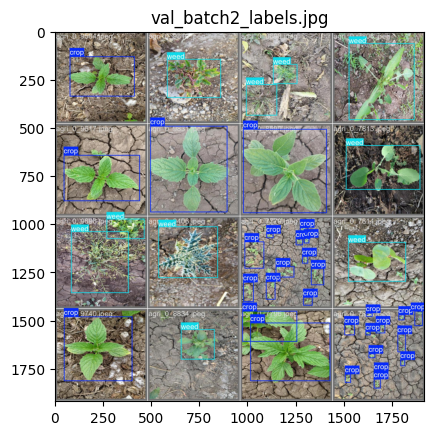

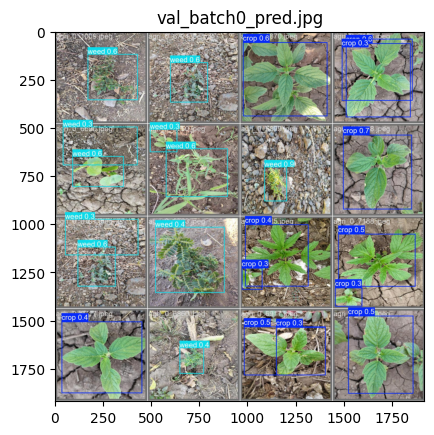

...

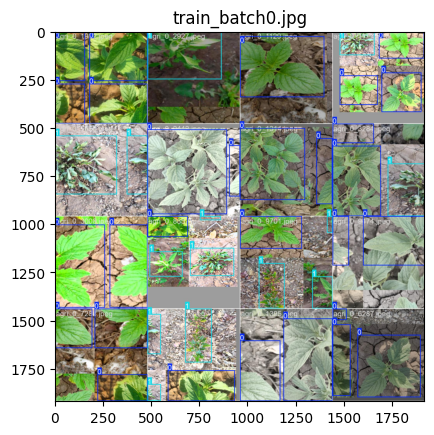

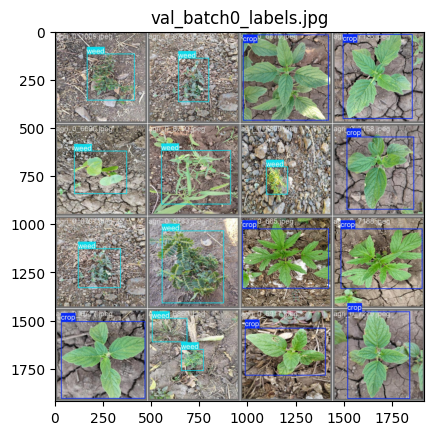

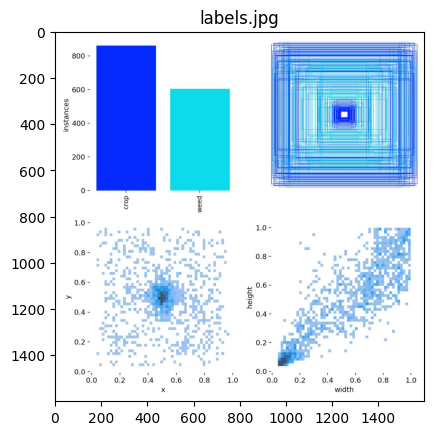

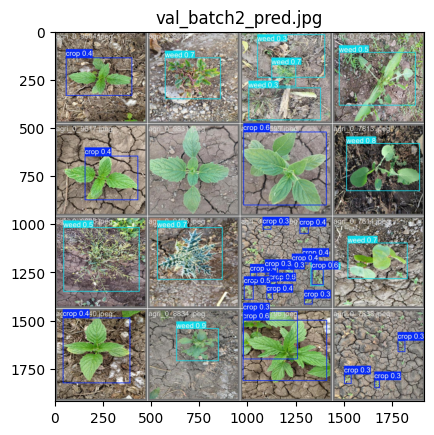

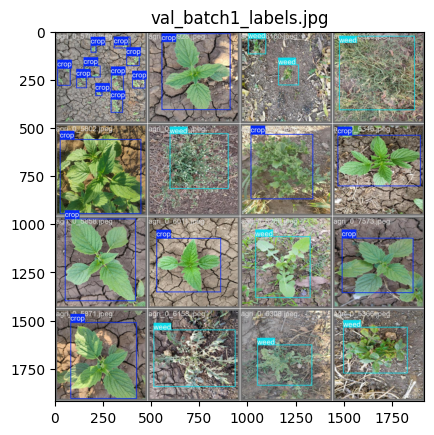

In [43]:
main_path = '/home/samir/weeds/weeds-detection/weeds-training-results/train6/'
for image in output_images:
    path = os.path.join(main_path, image)  # This ensures the path is correctly constructed
    tmp = plt.imread(path)
    plt.imshow(tmp)
    plt.title(image)
    plt.show()

In [44]:
matrix_images = [t for t in os.listdir('/home/samir/weeds/weeds-detection/weeds-training-results/train6/') if '.png' in t.lower()]

In [45]:
matrix_images

['PR_curve.png',
 'R_curve.png',
 'confusion_matrix_normalized.png',
 'results.png',
 'P_curve.png',
 'confusion_matrix.png',
 'F1_curve.png']

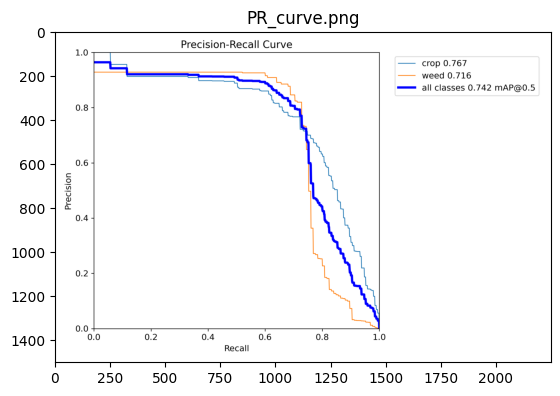

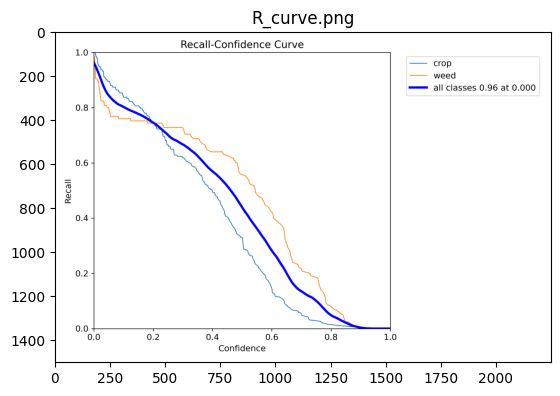

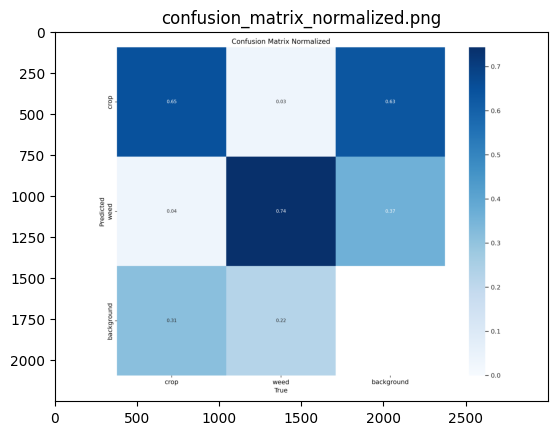

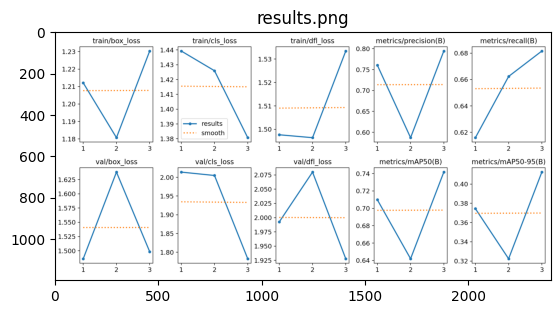

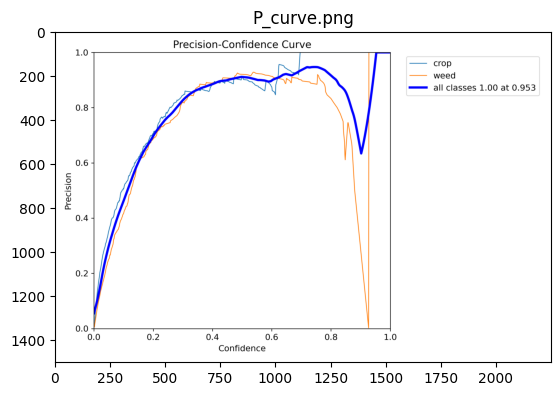

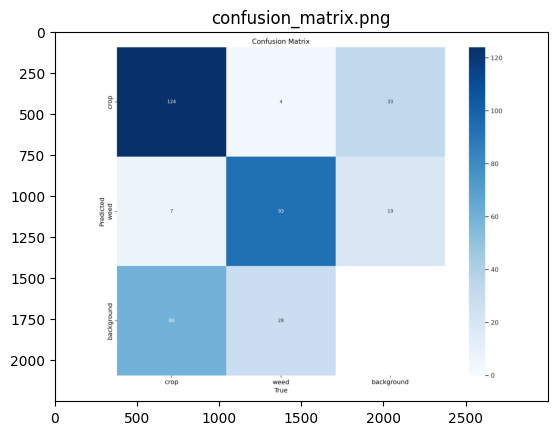

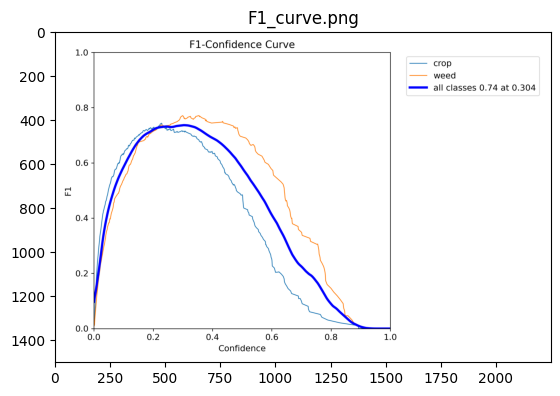

In [46]:
main_path = '/home/samir/weeds/weeds-detection/weeds-training-results/train6/'
for image in matrix_images:
  path=main_path +image
  tmp = plt.imread(path)
  plt.imshow(tmp)
  plt.title(image)
  plt.show()

# We use our own model
#### Once the model is generated or trained our model saved in the /home/samir/weeds/weeds-detection/weeds-training-results/train6/ folder(best.pt).Now we can deploy our new model.

In [47]:
model1  = YOLO('/home/samir/weeds/weeds-detection/weeds-training-results/train6/weights/best.pt')

In [48]:
model1.val() 

Ultralytics 8.3.35 🚀 Python-3.8.10 torch-2.4.1+cu121 CPU (Intel Core(TM) i5-8350U 1.70GHz)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/samir/Documents/weeds/weeds-detection/output/val/labels.cache... 195 image
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%


                   all        195        316      0.792      0.678      0.742      0.412
                  crop         96        191      0.818      0.628      0.767      0.448
                  weed        100        125      0.766      0.728      0.716      0.376
Speed: 2.0ms preprocess, 102.3ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to /home/samir/.pyenv/runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7890454dda30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [49]:
model1.predict(source='output/test/images',save=True)


image 1/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1026.jpeg: 640x640 1 crop, 334.8ms
image 2/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1146.jpeg: 640x640 1 weed, 230.9ms
image 3/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1192.jpeg: 640x640 2 weeds, 114.6ms
image 4/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1210.jpeg: 640x640 1 weed, 113.2ms
image 5/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1211.jpeg: 640x640 1 crop, 140.8ms
image 6/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1258.jpeg: 640x640 1 weed, 116.1ms
image 7/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1332.jpeg: 640x640 1 crop, 122.5ms
image 8/196 /home/samir/Documents/weeds/weeds-detection/output/test/images/agri_0_1334.jpeg: 640x640 1 weed, 112.8ms
image 9/196 /home/samir/Documents/weeds/weeds-detection/output

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'crop', 1: 'weed'}
 obb: None
 orig_img: array([[[ 49,  65,  81],
         [ 56,  72,  88],
         [ 57,  73,  89],
         ...,
         [179, 207, 224],
         [179, 209, 226],
         [178, 208, 225]],
 
        [[ 98, 114, 130],
         [100, 116, 132],
         [ 98, 114, 130],
         ...,
         [146, 174, 191],
         [139, 169, 186],
         [134, 164, 181]],
 
        [[100, 116, 132],
         [101, 117, 133],
         [103, 119, 135],
         ...,
         [178, 205, 225],
         [182, 212, 231],
         [181, 211, 230]],
 
        ...,
 
        [[ 11,  11,  29],
         [  9,  11,  29],
         [  2,   5,  20],
         ...,
         [ 99, 112, 128],
         [ 98, 111, 127],
         [100, 113, 129]],
 
        [[ 23,  21,  40],
         [ 27,  27,  45],
         [ 26,  26,  42],
         ...,
         

In [5]:
ls runs/detect/predict | grep '.jpeg'


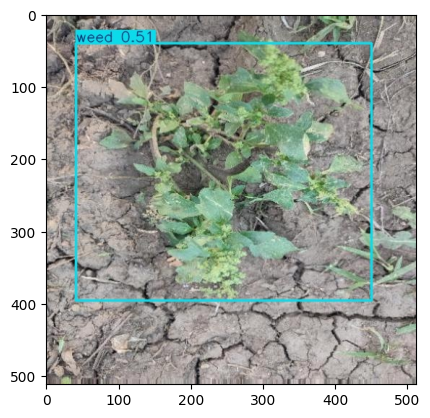

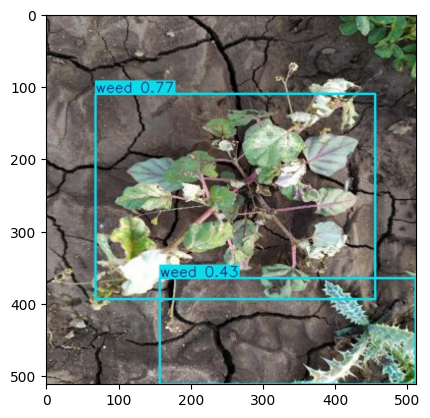

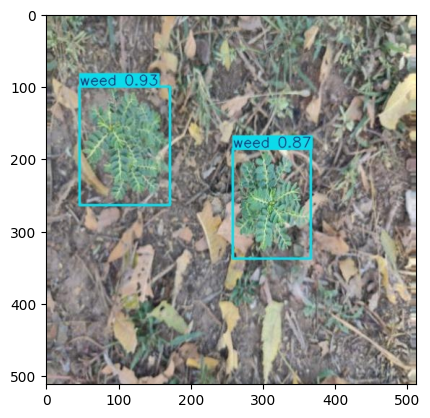

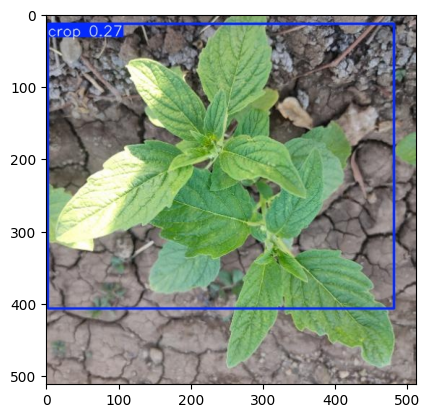

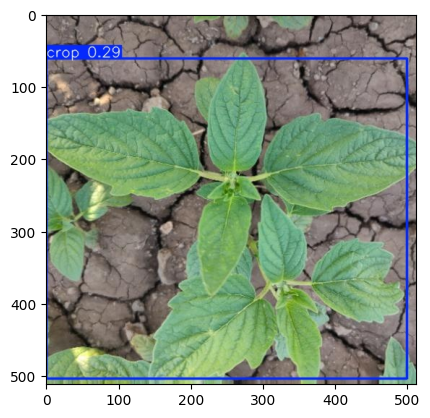

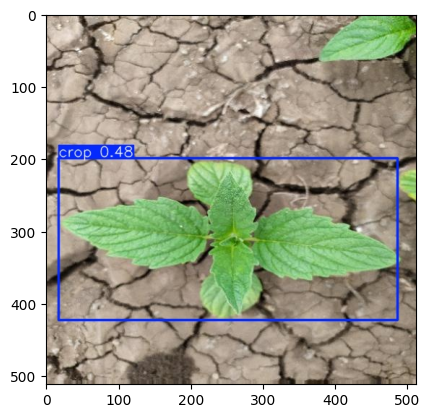

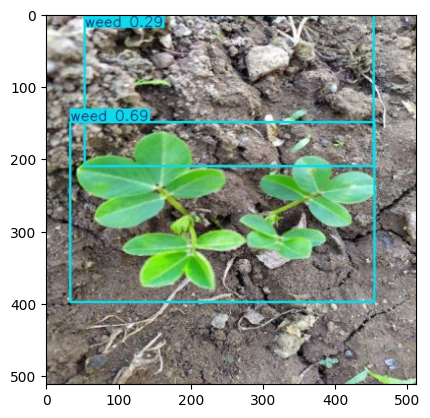

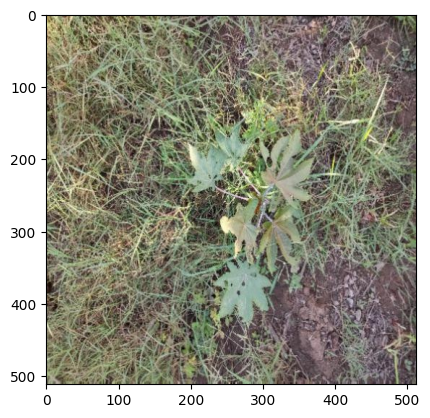

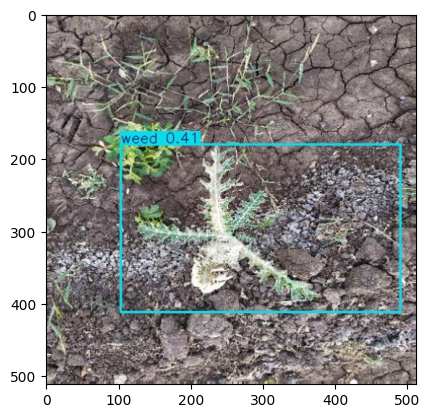

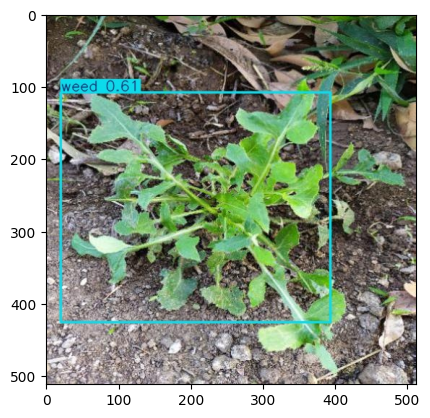

In [17]:
import os
import matplotlib.pyplot as plt

# Get list of predicted images (include '.jpg')
predicted_image = [t for t in os.listdir('/home/samir/Documents/weeds/weeds-detection/runs/detect/predict') if '.jpg' in t.lower()]

# Define the path to the directory
predict_path = '/home/samir/Documents/weeds/weeds-detection/runs/detect/predict/'

# Select a subset of images
sample_image = predicted_image[10:20]

# Display the images
for image in sample_image:
    path = os.path.join(predict_path, image)  # Construct the full path
    tmp = plt.imread(path)  # Read the image
    plt.imshow(tmp)  # Display the image
    plt.grid(False)  # Disable grid lines
    plt.show()
